# Consignes Projet 5

Vous êtes consultant pour [Olist](https://olist.com/), une entreprise brésilienne qui propose une solution de vente sur les marketplaces en ligne.

La page d'accueil du site Olist

**Olist** souhaite que vous fournissiez à ses équipes d'e-commerce une **segmentation des clients** qu'elles pourront utiliser au quotidien pour leurs campagnes de communication.

Votre objectif est de **comprendre les différents types d'utilisateurs** grâce à leur comportement et à leurs données personnelles.

Vous devrez **fournir à l'équipe marketing une description actionable** de votre segmentation et de sa logique sous-jacente pour une utilisation optimale, ainsi qu'une **proposition de contrat de maintenance** basée sur une analyse de la stabilité des segments au cours du temps.

## Les données

Pour cette mission, Olist vous fournit une [base de données](https://www.kaggle.com/olistbr/brazilian-ecommerce) anonymisée comportant des informations sur l'historique de commandes, les produits achetés, les commentaires de satisfaction, et la localisation des clients depuis janvier 2017.

## Votre mission

Votre mission est d'aider les équipes d'Olist à comprendre les différents types d'utilisateurs. Vous utiliserez donc des méthodes non supervisées pour regrouper des clients de profils similaires. Ces catégories pourront être utilisées par l'équipe Marketing pour mieux communiquer.

Vous créez donc un notebook et démarrez votre travail d'analyse exploratoire.

Vous réalisez donc trois autres documents afin de préparer une réponse à Olist : 

-   un notebook avec des essais des différentes approches de modélisation ;
-   un notebook de simulation pour déterminer la fréquence nécessaire de mise à jour du modèle de segmentation, afin que celui-ci reste pertinent ;
-   une présentation pour un collègue afin d'obtenir ses retours sur votre approche.

## Livrables

-   Un **notebook de l'analyse exploratoire** (non cleané, pour comprendre votre démarche)
-   Un **notebook** (ou code commenté au choix) **d'essais** des différentes approches de modélisation (non cleané, pour comprendre votre démarche)
-   Un **notebook de simulation pour déterminer la fréquence nécessaire de mise à jour** du modèle de segmentation
-   Un **support de présentation** pour présenter votre travail à un collègue.

# Sommaire

[Analyse des données]("## Analyse des données")

## Importation des bibliothèques

In [2]:
# %pip install pandas
# %pip install numpy
# %pip install matplotlib
# %pip install seaborn
# %pip install duckdb
# %pip install folium
# %pip install unidecode

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import duckdb as ddb
import datetime as dt
import folium
import unidecode

## Fonctions

In [4]:
def detailed_describe(df):
    print("*** *** ***")
    print(df.attrs["name"])
    print("*** *** ***")
    print(df.head())
    print(customers.isnull().sum())
    numeric_columns = df.select_dtypes(include=np.number)
    if not numeric_columns.empty:
        print(numeric_columns.describe())
        print(numeric_columns.isna().sum())
    print(df.shape)
    print("")
    print("")

# ########## ########## ########## ########## ##########
# Visualisation de la distribution des données
# ########## ########## ########## ########## ##########
def visualize_distribution(df):
    for column in df.select_dtypes(["int8", "int16", "int32", "int64", "float32", "float64"]).columns:
        visualize_values(df, column)
    
    categories = df.select_dtypes(exclude=["int8", "int16", "int32", "int64", "float32", "float64"]).columns
    print(df.attrs["name"])
    print(df[categories].nunique())
    for column in categories:
        if df[column].nunique() <= 100:
            visualize_categories(df, column)

# ########## ########## ########## ########## ##########
# Visualisation de la distribution d'une valeur numérique
# ########## ########## ########## ########## ##########
def visualize_values(df, column):
    fig, axes = plt.subplots(1, 2, figsize=[16, 8])
    sns.histplot(df[column], ax=axes[0])
    sns.boxplot(df[column], ax=axes[1])
    plt.suptitle(df.attrs["name"] + " - Distribution de " + column)
    plt.show()

# ########## ########## ########## ########## ##########
# Visualisation de la distribution d'une catégorie
# ########## ########## ########## ########## ##########
def visualize_categories(df, column):
    df_sorted = df.sort_values(by=column)

    fig = plt.figure(figsize=[16, 8])
    sns.countplot(df_sorted, x=column)
    plt.title(df.attrs["name"] + " - Distribution des " + column)
    plt.xticks(rotation=90)
    plt.show()

# ########## ########## ########## ########## ##########
# Affichage des colonnes avec des valeurs nulles
# ########## ########## ########## ########## ##########
def analyze_nulls(df):
    nulls = pd.DataFrame(
        df.isna().sum(), 
        columns=["Nulls"]
    ).sort_values(by=["Nulls"])

    if nulls.loc[nulls["Nulls"].gt(0)].shape[0] > 0:
        plt.figure(figsize=(10, 5))
        chart = sns.barplot(nulls.loc[nulls["Nulls"].gt(0)].transpose())
        chart.set_xticklabels(chart.get_xticklabels(),
                            rotation=45, horizontalalignment='right')
        plt.title(df.attrs["name"] + " - valeurs nulles sur " + str(df.shape[0]))
        plt.show()



# ########## ########## ########## ########## ##########
# Visualisation des corrélations linéaires
# ########## ########## ########## ########## ##########
def show_correlogram(df):
    numeric_columns = df.select_dtypes(
        ["int8", "int16", "int32", "int64", "float32", "float64"])
    corr = numeric_columns.corr()
    sns.set(rc={"figure.figsize": (20, 10)})
    sns.heatmap(
        corr,
        annot=True,
        fmt='.2f',
        vmin=-1,
        vmax=1,
        center=0,
        cmap='coolwarm'
    )


# ########## ########## ########## ########## ##########
# Evaluation de la régression
# ########## ########## ########## ########## ##########
def analyze_regression(y, y_pred):
    # 80% des prédictions

    # Calcul du coefficient de détermination (R²)
    r2 = np.round(r2_score(y, y_pred), 3)
    print("R² :", r2)

    # Calcul de l'erreur absolue moyenne (MAE)
    mae = np.round(mean_absolute_error(y, y_pred), 0)
    print("MAE :", mae)

    # Calcul du pourcentage d'erreur absolue (MAPE)
    mape = np.round(100 * mean_absolute_percentage_error(y, y_pred), 1)
    print("MAPE :", mape, "%")

    # Calcul de l'erreur quadratique moyenne (RMSE)
    rmse = np.round(math.sqrt(mean_squared_error(y, y_pred)), 0)
    print("RMSE :", rmse)

    # Calcul du taux de prédictions entre 90% et 110% de la valeur réelle
    predictions_within_range = np.round(
        ((y_pred >= 0.80 * y) & (y_pred <= 1.20 * y_real_test)).mean() * 100, 1)
    print("Taux de prédictions entre 80% et 120% :",
          predictions_within_range, "%")

# ########## ########## ########## ########## ##########
# Visualisation de la performance de la régression
# ########## ########## ########## ########## ##########
def color_to_use(error):
    if np.isinf(error):
        return "#A0003C"
    elif error > 80:
        return "#A0003C"
    elif error > 50:
        return "#FF8BA5"
    elif error > 20:
        return "#E9E861"
    elif error > 10:
        return "#9AE687"
    else:
        return "#0BBBAB"

def label_to_use(error):
    if np.isinf(error):
        return "> 80%"
    elif error > 80:
        return "> 80%"
    elif error > 50:
        return "<=80%"
    elif error > 20:
        return "<= 50%"
    elif error > 10:
        return "<= 20%"
    else:
        return "<= 10%"


def show_regression_error(y, y_pred):
    df_error = pd.DataFrame({"Valeurs réelles": y, "Prédictions": y_pred})
    df_error["Error"] = abs(df_error["Valeurs réelles"] -
                            df_error["Prédictions"]) / df_error["Valeurs réelles"] * 100
    df_error["color to use"] = df_error["Error"].apply(color_to_use)
    df_error["Erreur en %"] = df_error["Error"].apply(label_to_use)

    df_error = df_error.sort_values(by="Error")
    labels = {
        "#A0003C": "erreur > 80%",
        "#FF8BA5": "50% < erreur <=80%",
        "#E9E861": "20% < erreur <= 50%",
        "#9AE687": "10% < erreur <= 20%",
        "#0BBBAB": "erreur < 10%"
    }
    fig, axes = plt.subplots(1, 2, figsize=[16, 8])
    fig = plt.figure(figsize=[8, 8])
    fig.patch.set_facecolor("#F0F0F0")
    plt.title("Ecart des prédictions en %", size=16)
    plt.xlabel("Valeurs réelles", size=13)
    plt.ylabel("Prédictions", size=13)
    plt.grid(color="#CCCCCC")
    for color in df_error["color to use"].unique():
        data = df_error.loc[df_error["color to use"] == color]
        label = labels[color]
        sns.scatterplot(
            data=data,
            x="Valeurs réelles",
            y="Prédictions",
            color=color,
            label=label,
            ax=axes[0]
        )

    fig.patch.set_facecolor("#F0F0F0")
    plt.title("Analyse des erreurs de prédictions en %", size=16)
    sns.histplot(
        data=df_error,
        x="Erreur en %",
        hue="Erreur en %",
        stat="percent",
        cumulative=True,
        multiple="stack",
        palette=[
            "#0BBBAB",
            "#9AE687",
            "#E9E861",
            "#FF8BA5",
            "#A0003C"
        ],
        ax=axes[1]
    )

# Importation des données

In [5]:
customers = pd.read_csv("data/olist_customers_dataset.csv")
geolocation = pd.read_csv("data/olist_geolocation_dataset.csv")
order_items = pd.read_csv("data/olist_order_items_dataset.csv")
order_payments = pd.read_csv("data/olist_order_payments_dataset.csv")
order_reviews = pd.read_csv("data/olist_order_reviews_dataset.csv")
orders = pd.read_csv("data/olist_orders_dataset.csv")
products = pd.read_csv("data/olist_products_dataset.csv")
sellers = pd.read_csv("data/olist_sellers_dataset.csv")
product_category_name_translation = pd.read_csv("data/product_category_name_translation.csv")

customers.attrs['name'] = "customers"
geolocation.attrs['name'] = "geolocation"
order_items.attrs['name'] = "order_items"
order_payments.attrs['name'] = "order_payments"
order_reviews.attrs['name'] = "order_reviews"
orders.attrs['name'] = "orders"
products.attrs['name'] = "products"
sellers.attrs['name'] = "sellers"
product_category_name_translation.attrs['name'] = "product_category_name_translation"


## Analyse des données

In [6]:
detailed_describe(customers)
detailed_describe(geolocation)
detailed_describe(order_items)
detailed_describe(order_payments)
detailed_describe(order_reviews)
detailed_describe(orders)
detailed_describe(products)
detailed_describe(sellers)
detailed_describe(product_category_name_translation)

*** *** ***
customers
*** *** ***
                        customer_id                customer_unique_id  \
0  06b8999e2fba1a1fbc88172c00ba8bc7  861eff4711a542e4b93843c6dd7febb0   
1  18955e83d337fd6b2def6b18a428ac77  290c77bc529b7ac935b93aa66c333dc3   
2  4e7b3e00288586ebd08712fdd0374a03  060e732b5b29e8181a18229c7b0b2b5e   
3  b2b6027bc5c5109e529d4dc6358b12c3  259dac757896d24d7702b9acbbff3f3c   
4  4f2d8ab171c80ec8364f7c12e35b23ad  345ecd01c38d18a9036ed96c73b8d066   

   customer_zip_code_prefix          customer_city customer_state  
0                     14409                 franca             SP  
1                      9790  sao bernardo do campo             SP  
2                      1151              sao paulo             SP  
3                      8775        mogi das cruzes             SP  
4                     13056               campinas             SP  
customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


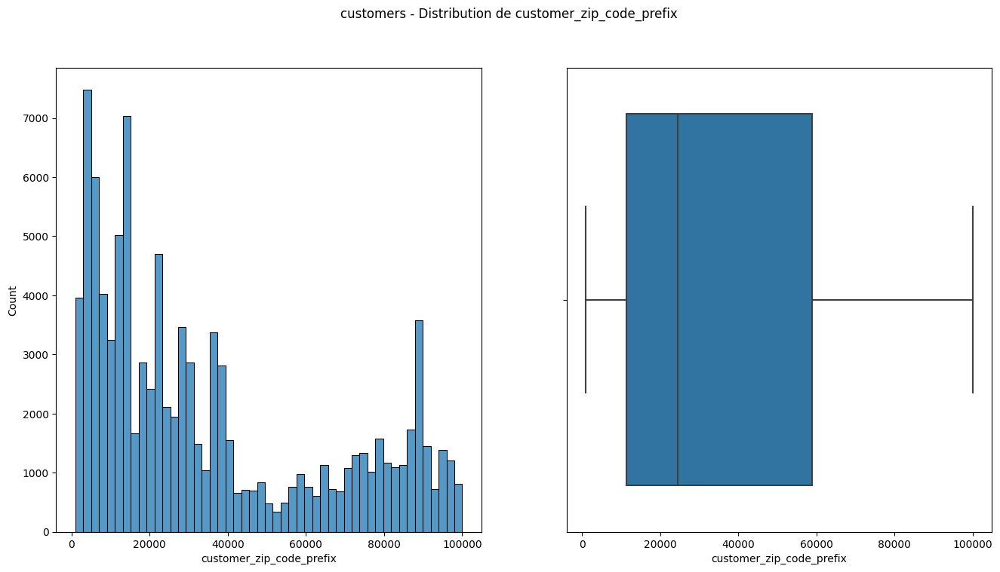

customers
customer_id           99441
customer_unique_id    96096
customer_city          4119
customer_state           27
dtype: int64


c:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

<Figure size 1600x800 with 0 Axes>

In [7]:
visualize_distribution(customers)
visualize_distribution(geolocation)
visualize_distribution(order_items)
visualize_distribution(order_payments)
visualize_distribution(order_reviews)
visualize_distribution(orders)
visualize_distribution(products)
visualize_distribution(sellers)


In [9]:

analyze_nulls(customers)
analyze_nulls(geolocation)
analyze_nulls(order_items)
analyze_nulls(order_payments)
analyze_nulls(order_reviews)
analyze_nulls(orders)
analyze_nulls(products)
analyze_nulls(sellers)
analyze_nulls(product_category_name_translation)


c:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

<Figure size 1000x500 with 0 Axes>

### Nettoyage des données

#### Suppression des valeurs nulles

##### Orders

Certaines dates de validation de commande et de livraison sont manquantes. 

On peut calculer le délai moyen entre les dates de commande et les dates de validation et livraison afin de calculer de nouvelles dates pour remplacer les dates manquantes.

##### Order Reviews

Certains commentaires ne sont pas renseignés.
 
On peut sans problème remplacer ces valeurs nulles par des chaînes vides.

In [10]:
order_reviews.review_comment_message = order_reviews.review_comment_message.fillna('')
order_reviews.review_comment_title = order_reviews.review_comment_title.fillna('')

### Customer ID et Customer unique ID

In [11]:
customer_ids = customers['customer_id'].unique().shape[0]
customer_unique_ids = customers['customer_unique_id'].unique().shape[0]
print("customer_ids : " + str(customer_ids))
print("customer_unique_ids : " + str(customer_unique_ids))
print('Ecart : ', np.round(100 * (customer_ids - customer_unique_ids) / customer_ids, 2), '%')

customer_ids : 99441
customer_unique_ids : 96096
Ecart :  3.36 %


La variable `customer_unique_id` représente l'idenfiant du client. 

La variable `customer_id` représente le code du client attribué à la commande. 

On retrouve ici l'écart de 3%, correspondant aux clients ayant passé plusieurs commandes. 

La table `customers` n'est pas la liste unique des clients mais la "relation" entre clients et commandes. 

Pour cette raison, on retrouve les clients ayant passé plusieurs commandes plusieurs fois dans le jeu de données. 


### Répartition des commandes dans le temps

In [12]:
print("Première commande du jeu de données : " + np.min(orders.order_purchase_timestamp))
print("Dernière commande du jeu de données : " + np.max(orders.order_purchase_timestamp))

Première commande du jeu de données : 2016-09-04 21:15:19
Dernière commande du jeu de données : 2018-10-17 17:30:18


<Figure size 2400x800 with 0 Axes>

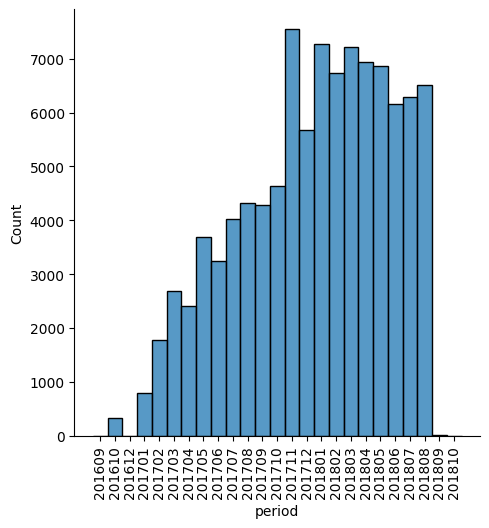

In [13]:
orders["period"] = orders[["order_purchase_timestamp"]].applymap(lambda o: str(dt.datetime.strptime(
    o, '%Y-%m-%d %H:%M:%S').year * 100 + dt.datetime.strptime(o, '%Y-%m-%d %H:%M:%S').month))
sorted_orders = orders.sort_values(by=["period"])

fig = plt.figure(figsize=[24, 8])
sns.displot(sorted_orders["period"])
plt.xticks(rotation=90)
plt.show()


On remarque que l'on a réellement des données à partir janvier 2017 et seulement jusqu'en août 2018.

Nous allons prendre en compte uniquement les commandes sur cette période. 

In [14]:
orders = orders.drop(orders[('201701' > orders.period) | (orders.period > '201808')].index)
orders.shape


(99092, 9)

In [15]:
geolocation.geolocation_city.unique()

array(['sao paulo', 'são paulo', 'sao bernardo do campo', ..., 'ciríaco',
       'estação', 'vila lângaro'], dtype=object)

## Cartographie

In [16]:
geolocation["decoded_city"] = geolocation["geolocation_city"].apply(unidecode.unidecode)

In [17]:
print("Nombre de villes dans le DataFrame : " + str(geolocation.geolocation_city.unique().shape[0]))
print("Nombre de villes après normalisation du nom : " + str(geolocation.decoded_city.unique().shape[0]))

Nombre de villes dans le DataFrame : 8011
Nombre de villes après normalisation du nom : 5969


In [19]:

# customers.columns

# 'geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng', 'geolocation_city', 'geolocation_state'
# 'customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state'

city_value_df = ddb.query(
    """
    SELECT
        decoded_city, 
        COUNT(DISTINCT o.order_id) as orders,
        SUM(payment_value) / COUNT(DISTINCT o.order_id) as mean_value,
        AVG(geolocation_lat) as latitude,
        AVG(geolocation_lng) as longitude
    FROM customers as c
    JOIN orders as o on c.customer_id = o.customer_id
    JOIN order_payments as p on o.order_id = p.order_id
    JOIN geolocation as g
        on customer_zip_code_prefix = geolocation_zip_code_prefix
        and customer_city = geolocation_city
    GROUP BY decoded_city
    """
).to_df()

city_value_df["normalized_orders"] = np.log(city_value_df["orders"]) / np.log(city_value_df["orders"].max())
city_value_df["normalized_mean_value"] = np.log(city_value_df["mean_value"]) / np.log(city_value_df["mean_value"].max())

import folium.plugins as plugins

m = folium.Map(location=[city_value_df.latitude.mean(), city_value_df.longitude.mean()], zoom_start=5)

marker_cluster = plugins.MarkerCluster().add_to(m)
for idx, row in city_value_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['decoded_city']
    ).add_to(marker_cluster)

# Afficher le menu déroulant
folium.LayerControl().add_to(m)

# Afficher la carte interactive
m

# # Boucle sur toutes les lignes du dataset
# for i in range(0, len(city_value_df)):
#     # Ajout d'un cercle sur la carte à la position (latitude, longitude) de chaque ligne
#     # avec un rayon de 100 mètres et un popup affichant l'adresse
#     folium.Circle([
#         city_value_df.iloc[i]['latitude'], 
#         city_value_df.iloc[i]['longitude']], 
#         popup=city_value_df.iloc[i]['decoded_city'], 
#         radius=30000 * city_value_df.iloc[i]['normalized_orders'],
#         fill=True
#     ).add_to(m)

# # Affichage de la carte interactive
# m


In [28]:
city_value_df.sort_values(["orders"])[city_value_df["orders"] > 750]

C:\Users\Zbook\AppData\Local\Temp\ipykernel_10076\3137666522.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  city_value_df.sort_values(["orders"])[city_value_df["orders"] > 750]


,decoded_city,orders,mean_value,latitude,longitude,normalized_orders,normalized_mean_value
2021,santo andre,793,23744.464628,-23.656368,-46.523505,0.691900,0.830638
3999,niteroi,848,77497.300307,-22.892658,-43.096054,0.698851,0.928162
3520,sao bernardo do campo,935,19502.255733,-23.712594,-46.559549,0.708973,0.814412
17,guarulhos,1187,14766.685282,-23.443423,-46.496188,0.733706,0.791479
480,salvador,1241,25142.493312,-12.979509,-38.460122,0.738317,0.835355
1896,porto alegre,1372,27024.955124,-30.047152,-51.197585,0.748718,0.841308
3559,campinas,1437,17604.870257,-22.902663,-47.075233,0.753515,0.805973
3162,curitiba,1515,26796.279624,-25.448878,-49.275847,0.758993,0.840607
3278,brasilia,1936,6207.967071,-15.814159,-47.989614,0.784407,0.720038
3694,belo horizonte,2758,41158.547103,-19.919900,-43.951537,0.821085,0.875990


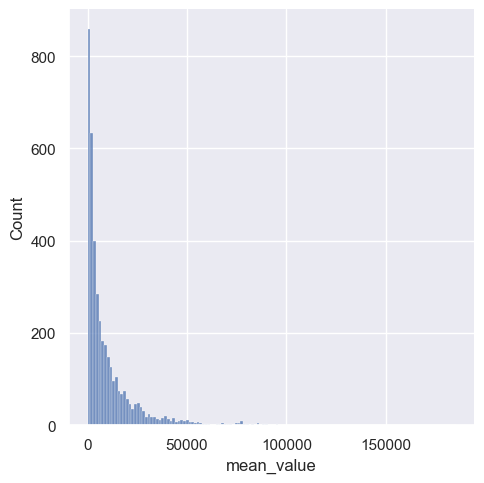

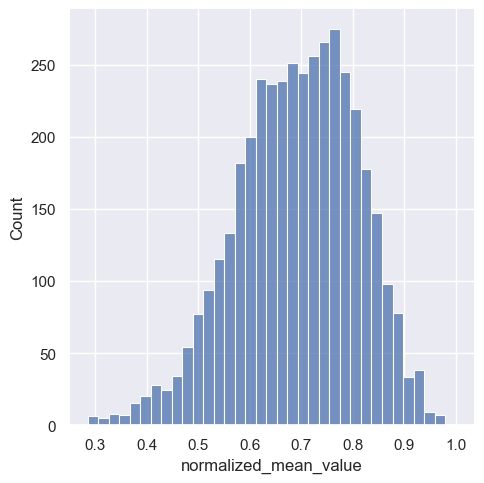

In [34]:
sns.displot(city_value_df["mean_value"])
plt.show()
sns.displot(city_value_df["normalized_mean_value"])
plt.show()

#np.log(city_value_df["orders"]) / np.log(city_value_df["orders"].max())

In [31]:
sortedCityDDF = city_value_df.sort_values(["orders"]).reset_index(drop=True)
sortedCityDDF["ordersIndex"] = sortedCityDDF.index

sortedCityDDF

,decoded_city,orders,mean_value,latitude,longitude,normalized_orders,normalized_mean_value,ordersIndex
0,amapa do maranhao,1,50.050000,-1.673258,-46.010303,0.000000,0.322608,0
1,mansidao,1,394.740000,-10.719694,-44.035798,0.000000,0.492873,1
2,vargem,1,2001.120000,-22.894550,-46.410633,0.000000,0.626700,2
3,santo antonio do planalto,1,1989.630000,-28.400261,-52.694168,0.000000,0.626225,3
4,aracatu,1,957.600000,-14.417742,-41.449894,0.000000,0.565936,4
...,...,...,...,...,...,...,...,...
4058,curitiba,1515,26796.279624,-25.448878,-49.275847,0.758993,0.840607,4058
4059,brasilia,1936,6207.967071,-15.814159,-47.989614,0.784407,0.720038,4059
4060,belo horizonte,2758,41158.547103,-19.919900,-43.951537,0.821085,0.875990,4060
4061,rio de janeiro,6843,47333.483588,-22.933014,-43.299411,0.915267,0.887514,4061


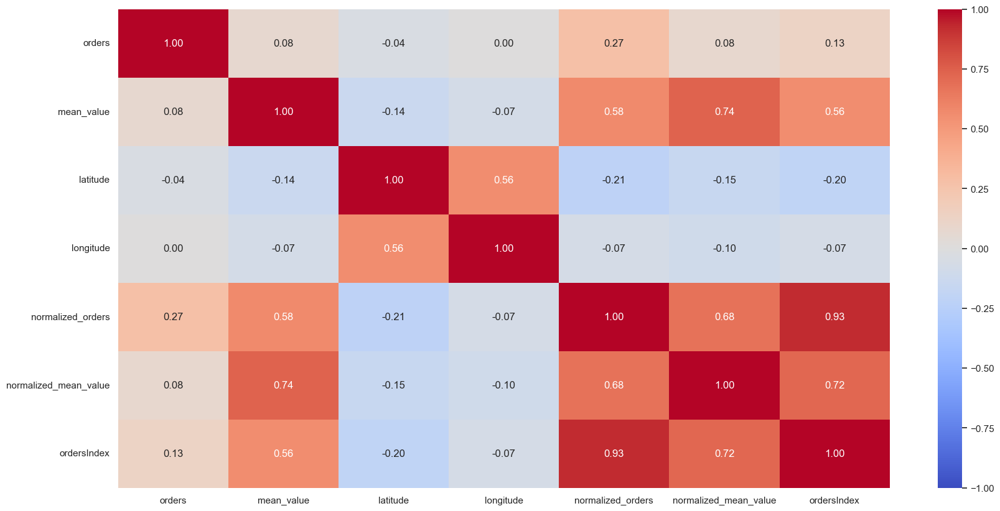

In [32]:
show_correlogram(sortedCityDDF)

In [20]:
# Boucle sur toutes les lignes du dataset
for i in range(0, len(city_value_df)):
    # Ajout d'un cercle sur la carte à la position (latitude, longitude) de chaque ligne
    # avec un rayon de 100 mètres et un popup affichant l'adresse
    folium.Circle([
        city_value_df.iloc[i]['latitude'], 
        city_value_df.iloc[i]['longitude']], 
        popup=city_value_df.iloc[i]['decoded_city'], 
        radius=30000 * city_value_df.iloc[i]['normalized_orders'],
        fill=True
    ).add_to(m)

# Affichage de la carte interactive
m


In [ ]:
# Création de la carte
m = folium.Map(location=[locations_df['lat'].mean(), locations_df['lng'].mean()], zoom_start=4)

# Ajout des clusters de marqueurs
marker_cluster = MarkerCluster().add_to(m)
for idx, row in locations_df.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=row['city'] + ', ' + row['state']
    ).add_to(marker_cluster)

# Afficher le menu déroulant
folium.LayerControl().add_to(m)

# Afficher la carte interactive
m

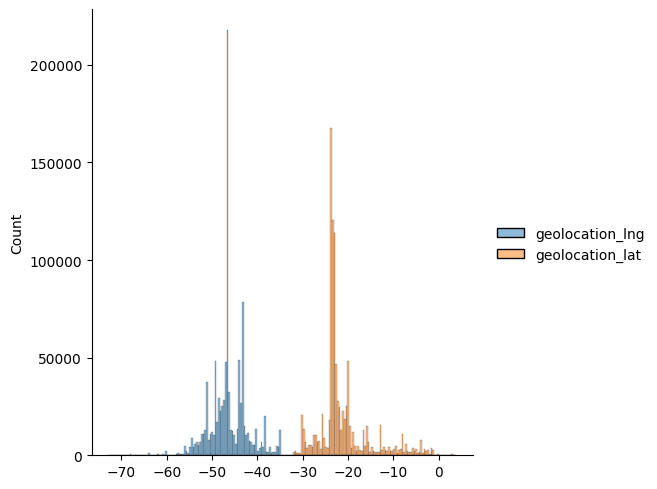

In [24]:
filter_geolocation = (geolocation.geolocation_lng.quantile(.00005) < geolocation.geolocation_lng) & (
        geolocation.geolocation_lng < geolocation.geolocation_lng.quantile(.99995))
    & (geolocation.geolocation_lat.quantile(.00005) < geolocation.geolocation_lat) & (geolocation.geolocation_lat < geolocation.geolocation_lat.quantile(.99995))
][["geolocation_lng", "geolocation_lat"]]


In [ ]:
# On vérifie que ce code n'est pas exécuté par défaut (False)
# if False:
    
# Import de la librairie folium pour créer une carte interactive
import folium

# Création d'une carte centrée sur la position moyenne des points
m = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=11)

# Boucle sur toutes les lignes du dataset
for i in range(0,len(data)):
    # Ajout d'un cercle sur la carte à la position (latitude, longitude) de chaque ligne
    # avec un rayon de 100 mètres et un popup affichant l'adresse
    folium.Circle([data.iloc[i]['Latitude'],data.iloc[i]['Longitude']], popup=data.iloc[i]['Address'], radius=100).add_to(m)

# Affichage de la carte interactive
m

# Essais

In [14]:
total_payment_and_order_by_customer = ddb.query(
    """
    SELECT
        customer_unique_id, 
        COUNT(DISTINCT o.order_id) as orders,
        SUM(payment_value) as total_payment
    FROM customers as c
    JOIN orders as o on c.customer_id = o.customer_id
    JOIN order_payments as p on o.order_id = p.order_id
    GROUP BY customer_unique_id
    """
).to_df()

total_payment_by_order = ddb.query(
    """
    SELECT
        orders,
        COUNT(DISTINCT customer_unique_id) as customers, 
        AVG(total_payment) as mean_payment
    FROM total_payment_and_order_by_customer as t
    GROUP BY orders
    """
).to_df()

total_payment_by_order.attrs["name"] = "total_payment_by_order"

total_payment_by_order.isnull().sum()

# total_payment_by_order = customers_payments.groupby('customer_unique_id').agg(
#     customers=pd.NameAgg(column="customer_unique_id", aggfunc="count"),
#     total_value=pd.NameAgg(column="payment_value", aggfunc="sum"),
#     orders=pd.NameAgg(column="order_id", aggfunc="count"),
# )


orders          0
customers       0
mean_payment    0
dtype: int64

/var/folders/15/b8vrvtf578n4r4drrlrq7xpc0000gn/T/ipykernel_75792/3194048813.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  g = sns.relplot(


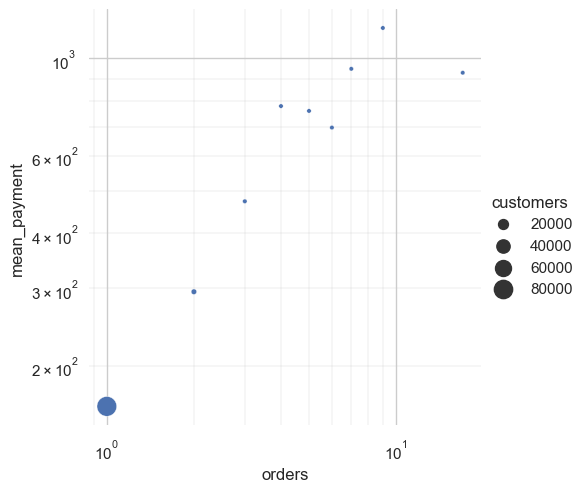

In [18]:
sns.set_theme(style="whitegrid")

cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)
g = sns.relplot(
    data=total_payment_by_order,
    x="orders", 
    y="mean_payment",
    # hue="year", 
    size="customers",
    palette=cmap, 
    sizes=(10, 200),
)
g.set(xscale="log", yscale="log")
g.ax.xaxis.grid(True, "minor", linewidth=.25)
g.ax.yaxis.grid(True, "minor", linewidth=.25)
g.despine(left=True, bottom=True)

In [ ]:
# Définition d'une fonction pour appliquer le traitement complet et créer de nouvelles features à partir d'une liste de données
def apply_features(liste_donnees):
    '''Application traitement complet et création de nouvelles features
    
    Traitement:
    * Création de nouvelles features
    * Merge de l'ensemble des dataframe dans un seul dataframe sur la clé client unique
    * Nettoyage des outliers
    
    Entree : liste d'objets 
    Sortie : dataframe cleané
    '''
    print('### Création features ###')
    # Récupération des dataframes à partir de la liste de données
    customers_local = liste_donnees[0].copy()
    geolocalisation_local = liste_donnees[1].copy()
    order_items_local = liste_donnees[2].copy()
    order_payments_local = liste_donnees[3].copy()
    order_reviews_local = liste_donnees[4].copy()
    orders_local = liste_donnees[5].copy()
    products_local = liste_donnees[6].copy()
    sellers_local = liste_donnees[7].copy()
    translation_local = liste_donnees[8].copy()
    
    # Nombre de produits achetés par client
    produits_par_client = pd.merge(customers_local, pd.merge(order_items_local, orders_local))
    nb_produits = produits_par_client.groupby('customer_id')['product_id'].count()
    nb_produits.rename('Nb_pdts', inplace=True)
    
    # 100 premières villes
    first_cities = customers_local.groupby(['customer_city']).count()['customer_state'].sort_values(ascending=False).head(100).index.tolist()
    index_cities = customers_local[~customers_local['customer_city'].isin(first_cities)].index
    customers_local.loc[index_cities, 'customer_city'] = 'Other'
    
    # Catégorie la plus achetée
    cat = pd.merge(produits_par_client, products_local).sort_values(['customer_id','product_category_name_english'], ascending=False).groupby(['customer_id','product_category_name_english']).head(1)[['customer_unique_id', 'product_category_name_english']]
    cat.columns = ['customer_unique_id', 'Cat_la_plus_achetee']
    cat.set_index('customer_unique_id', inplace=True)

    # Montant moyen des achats
    achats_moy = pd.merge(order_items_local, orders_local).groupby(['customer_id', 'order_id'])['price'].sum().groupby(['customer_id']).mean()
    achats_moy.rename('Tot_moy_achats', inplace=True)

    # Montant maximum des achats
    achats_max = pd.merge(order_items_local, orders_local).groupby(['customer_id', 'order_id'])['price'].max().groupby(['customer_id']).max()
    achats_max.rename('Mont_max_achats', inplace=True)
    
    # Nombre moyen de produits par commande
    nb_moyen_prod = pd.merge(order_items_local, orders_local).groupby(['customer_id', 'order_id'])['price'].count().groupby(['customer_id']).mean()
    nb_moyen_prod.rename('Nb_moy_pdts_par_com', inplace=True)
    
    # Délai moyen de livraison
    delai_delivery = pd.merge(orders_local, order_items_local)
    delai_delivery.set_index('customer_id', inplace=True)
    delai_delivery = delai_delivery['order_delivered_customer_date'] - delai_delivery['order_purchase_timestamp']
    delai_delivery.rename('Delai_Moy_Commande', inplace=True)
    delai_delivery = delai_delivery.dt.days + 1
    
    # Heure du dernier achat
    date_achat = pd.merge(order_items_local, orders_local)[['customer_id', 'order_purchase_timestamp']].groupby(['customer_id']).max()
    date_achat['heure_achat'] = date_achat['order_purchase_timestamp'].apply(lambda x: x.hour)

    # Jour de la semaine du dernier achat
    date_achat['jour_achat'] = date_achat['order_purchase_timestamp'].apply(lambda x: x.weekday())

    # Nombre de jours écoulés depuis le dernier achat
    date_achat['delai_dernier_achat'] = date_achat['order_purchase_timestamp'].max() -  date_achat['order_purchase_timestamp']
    date_achat['delai_dernier_achat'] = date_achat['delai_dernier_achat'].apply(lambda x: x.days)
    
    # Note moyenne des commentaires
    note_moy = pd.merge(order_reviews_local, orders_local).groupby('customer_id')['review_score'].mean()
    note_moy.rename('Note_Moy_Com', inplace=True)
    
    # Moyen de paiement le plus utilisé
    paiement = pd.merge(orders_local, order_payments_local).sort_values(['customer_id','payment_type','payment_installments'], ascending=False).groupby(['customer_id', 'payment_type','payment_installments']).head(1)[['customer_id', 'payment_type','payment_installments']]
    paiement.columns = ['customer_id', 'Moy_Paiment','Facilités']
    paiement.set_index('customer_id', inplace=True)

    customers_local.set_index('customer_id', inplace=True)
    
    # Merge des nouvelles features avec le dataframe customers_local
    for df in [nb_produits, achats_moy, achats_max, delai_delivery, nb_moyen_prod, date_achat, note_moy, paiement]:
        customers_local = pd.merge(left=customers_local, right=df, how='left', left_index=True, right_index=True)

    customers_local.reset_index(inplace=True)
    cat.reset_index(inplace=True)
    
    # Conversion des colonnes customer_id en type 'object'
    customers_local['customer_id'] = customers_local['customer_id'].astype('object')
    cat['customer_unique_id'] = cat['customer_unique_id'].astype('object')
    
    # Merge du dataframe customers_local avec la catégorie la plus achetée
    customers_local = pd.merge(left=cat, right=customers_local, on='customer_unique_id', how='right')
    customers_local.reset_index(inplace=True)
    
    print('### Cleaning NaN ###')
    # Cleaning des NaN des features
    customers_local['Cat_la_plus_achetee'].fillna('Unknown', inplace=True)
    customers_local[['Nb_pdts', 'Tot_moy_achats', 'Mont_max_achats', 'Nb_moy_pdts_par_com']].dropna(how='all', axis=0, inplace=True)
    customers_local['Delai_Moy_Commande'].fillna(-1, inplace=True)
    customers_local.dropna(axis=0, inplace=True)

    print('### Aggrégation des features sur id client unique ###')
    # Agrégation des clients par identifiant unique
    dict_agg = {
        'Cat_la_plus_achetee': lambda x: x.mode()[0],
        'customer_zip_code_prefix': lambda x: x.mode()[0],
        'customer_city': lambda x: x.mode()[0],
        'customer_state': lambda x: x.mode()[0],
        'Nb_pdts': 'sum',
        'Tot_moy_achats': 'mean',
        'Mont_max_achats': 'max',
        'Delai_Moy_Commande': 'mean',
        'Nb_moy_pdts_par_com': 'mean',
        'order_purchase_timestamp': 'max',
        'heure_achat': lambda x: x.mode()[0],
        'jour_achat': lambda x: x.mode()[0],
        'delai_dernier_achat': 'min',
        'Note_Moy_Com': 'mean',
        'Moy_Paiment': lambda x: x.mode()[0],
        'Facilités': 'mean',
        'geolocation_lat': 'mean',
        'geolocation_lng': 'mean',
        ('price', 'home'): 'sum',
        ('price', 'appliances'): 'sum',
        ('price', 'construction'): 'sum',
        ('price', 'office'): 'sum',
        ('price', 'electronics'): 'sum',
        ('price', 'arts'): 'sum',
        ('price', 'fashion'): 'sum',
        ('price', 'health_beauty'): 'sum',
        ('price', 'sports_leisure'): 'sum',
        ('price', 'garden_pets'): 'sum',
        ('price', 'auto'): 'sum',
        ('price', 'food_drinks'): 'sum',
        ('price', 'other'): 'sum'
    }

    print('### Ajout des dépenses par catégories ###')
    # Montant dépensé par catégorie de produits
    table_cat = pd.merge(customers_local, pd.merge(pd.merge(products_local, translation_local), pd.merge(order_items_local, orders_local)))[['customer_unique_id', 'product_category_name_english', 'price']]
    table_cat['product_category_name_english'] = table_cat['product_category_name_english'].map(dict_categories)
    table_cat = pd.pivot_table(table_cat, index='customer_unique_id', columns='product_category_name_english', aggfunc=np.sum, fill_value=0).reset_index()
    customers_local = pd.merge(customers_local, table_cat, left_on='customer_unique_id', right_on='customer_unique_id')
    
    # Merge des informations géographiques
    geol = pd.merge(customers_local, geolocalisation_local, how='left', left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix').groupby('customer_unique_id').mean()[['geolocation_lat', 'geolocation_lng']].reset_index()
    customers_local = pd.merge(customers_local, geol, left_on='customer_unique_id', right_on='customer_unique_id')
    
    # Agrégation finale par identifiant unique du client
    customers_local = customers_local.groupby('customer_unique_id').agg(dict_agg)
    customers_local['Cat_la_plus_achetee'] = customers_local['Cat_la_plus_achetee'].map(dict_categories)
    
    print('### Outliers ###')
    # Nettoyage des outliers
    print('taille du jeu de données pré-nettoyage outliers : ', customers_local.shape)
    customers_local = clean_outliers(customers_local)
    print('taille du jeu de données post-nettoyage outliers : ', customers_local.shape)
    
    print('### Log transformation ###')
    # Transformation log
    columns_log = ['Tot_moy_achats', 'Mont_max_achats']
    customers_local[columns_log] = np.log(customers_local[columns_log])
    return customers_local

In [137]:
df_rfm = ddb.query(
    """
    SELECT
        customer_unique_id, 
        COUNT(DISTINCT o.order_id) as orders,
        SUM(payment_value) as total_payment
    FROM customers as c
    JOIN orders as o on c.customer_id = o.customer_id
    JOIN order_payments as p on o.order_id = p.order_id
    GROUP BY customer_unique_id
    """
).to_df()

df_rfm

,customer_unique_id,orders,total_payment
0,73de59bf3a2643b862a6045683ab50a8,1,145.07
1,3ffe2cd1b6dd115eea664606df762ac8,1,124.76
2,51c4ac3413acf4a49b78fe6be0904360,1,1019.11
3,be503af00c47c568e3fffd9b2344b5c6,1,80.56
4,e1b3bf2f6bf4b145baf50144f7d4e1aa,1,38.86
...,...,...,...
95769,f700834183b39b1c1f18fd42d727b386,1,58.79
95770,89f87ffdd991f5c7a57c14570e5bab8d,1,31.34
95771,fa7b88d0c613b6a2c749e2cce1d558ee,1,70.03
95772,587be5fcece22a7d73da8d30594cecc9,1,116.20
